This notebook will investigate on the use of a Pre-trained Speaker Encoder from voice filter.
See https://github.com/mindslab-ai/voicefilter


In [162]:
import torch
import librosa
import hydra
import torch.nn as nn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from IPython.display import Audio, display
from tqdm import tqdm
from sklearn.manifold import TSNE
from hydra import compose, initialize
from src.datamodule.audio_datamodule import AudioDataModule

In [163]:
class Dotdict(dict):
    """
    a dictionary that supports dot notation
    as well as dictionary access notation
    usage: d = DotDict() or d = DotDict({'val1':'first'})
    set attributes: d.val2 = 'second' or d['val2'] = 'second'
    get attributes: d.val2 or d['val2']
    """
    __getattr__ = dict.__getitem__
    __setattr__ = dict.__setitem__
    __delattr__ = dict.__delitem__

    def __init__(self, dct=None):
        dct = dict() if not dct else dct
        for key, value in dct.items():
            if hasattr(value, 'keys'):
                value = Dotdict(value)
            self[key] = value

In [164]:
# params
hp = Dotdict()
embedder = Dotdict()

embedder.num_mels = 40
embedder.n_fft = 512
embedder.emb_dim = 256
embedder.lstm_hidden = 768
embedder.lstm_layers = 3
embedder.window = 80
embedder.stride = 40
hp.embedder = embedder

audio = Dotdict()
audio.n_fft = 1200
audio.num_freq = 601 # n_fft//2 + 1
audio.sample_rate = 16000
audio.hop_length = 160
audio.win_length = 400
audio.min_level_db = -100.0
audio.ref_level_db = 20.0
audio.preemphasis = 0.97
audio.power = 0.30
hp.audio = audio

In [165]:
class LinearNorm(nn.Module):
    def __init__(self, hp):
        super(LinearNorm, self).__init__()
        self.linear_layer = nn.Linear(hp.embedder.lstm_hidden, hp.embedder.emb_dim)

    def forward(self, x):
        return self.linear_layer(x)


class SpeechEmbedder(nn.Module):
    def __init__(self, hp):
        super(SpeechEmbedder, self).__init__()
        self.lstm = nn.LSTM(hp.embedder.num_mels,
                            hp.embedder.lstm_hidden,
                            num_layers=hp.embedder.lstm_layers,
                            batch_first=True)
        self.proj = LinearNorm(hp)
        self.hp = hp

    def forward(self, mel):
        # (num_mels, T)
        mels = mel.unfold(1, self.hp.embedder.window, self.hp.embedder.stride) # (num_mels, T', window)
        mels = mels.permute(1, 2, 0) # (T', window, num_mels)
        x, _ = self.lstm(mels) # (T', window, lstm_hidden)
        x = x[:, -1, :] # (T', lstm_hidden), use last frame only
        x = self.proj(x) # (T', emb_dim)
        x = x / torch.norm(x, p=2, dim=1, keepdim=True) # (T', emb_dim)
        x = x.sum(0) / x.size(0) # (emb_dim), average pooling over time frames
        return x

In [166]:
# adapted from Keith Ito's tacotron implementation
# https://github.com/keithito/tacotron/blob/master/util/audio.py

class AudioHelper():
    def __init__(self, hp):
        self.hp = hp
        self.mel_basis = librosa.filters.mel(sr=hp.audio.sample_rate,
                                             n_fft=hp.embedder.n_fft,
                                             n_mels=hp.embedder.num_mels)

    def get_mel(self, y):
        y = librosa.core.stft(y=y, n_fft=self.hp.embedder.n_fft,
                              hop_length=self.hp.audio.hop_length,
                              win_length=self.hp.audio.win_length,
                              window='hann')
        magnitudes = np.abs(y) ** 2
        mel = np.log10(np.dot(self.mel_basis, magnitudes) + 1e-6)
        return mel

    def wav2spec(self, y):
        D = self.stft(y)
        S = self.amp_to_db(np.abs(D)) - self.hp.audio.ref_level_db
        S, D = self.normalize(S), np.angle(D)
        S, D = S.T, D.T # to make [time, freq]
        return S, D

    def spec2wav(self, spectrogram, phase):
        spectrogram, phase = spectrogram.T, phase.T
        # used during inference only
        # spectrogram: enhanced output
        # phase: use noisy input's phase, so no GLA is required
        S = self.db_to_amp(self.denormalize(spectrogram) + self.hp.audio.ref_level_db)
        return self.istft(S, phase)

    def stft(self, y):
        return librosa.stft(y=y, n_fft=self.hp.audio.n_fft,
                            hop_length=self.hp.audio.hop_length,
                            win_length=self.hp.audio.win_length)

    def istft(self, mag, phase):
        stft_matrix = mag * np.exp(1j*phase)
        return librosa.istft(stft_matrix,
                             hop_length=self.hp.audio.hop_length,
                             win_length=self.hp.audio.win_length)

    def amp_to_db(self, x):
        return 20.0 * np.log10(np.maximum(1e-5, x))

    def db_to_amp(self, x):
        return np.power(10.0, x * 0.05)

    def normalize(self, S):
        return np.clip(S / -self.hp.audio.min_level_db, -1.0, 0.0) + 1.0

    def denormalize(self, S):
        return (np.clip(S, 0.0, 1.0) - 1.0) * -self.hp.audio.min_level_db

In [167]:
def get_embedding(fpath_or_wav, embedder, audio_helper):
    if isinstance(fpath_or_wav, str) or isinstance(fpath_or_wav, Path):
        dvec_wav , _ = librosa.load(fpath_or_wav, sr=16000)
    else:
        dvec_wav = fpath_or_wav

    dvec_mel = audio_helper.get_mel(dvec_wav)
    dvec_mel = torch.from_numpy(dvec_mel).float()
    with torch.no_grad():
        dvec = embedder(dvec_mel)
        dvec = dvec.detach().cpu().numpy()
        return dvec, dvec_wav

In [168]:
def cosine_similarity(a, b):
    return (a @ b.T) / (np.linalg.norm(a)*np.linalg.norm(b))

# Load the embedder model

In [169]:
embedder_path = '../models/pre-trained/voice_filter_embedder.pt'
embedder = SpeechEmbedder(hp)
chkpt_embed = torch.load(embedder_path, map_location='cpu')
embedder.load_state_dict(chkpt_embed)
embedder.eval()
audio = AudioHelper(hp)

# KENN's embedding

In [170]:
sound_path_KENN_1 = '../data/raw/nus-48e/KENN/sing/12.wav'
sound_path_KENN_2 = '../data/raw/nus-48e/KENN/sing/17.wav'

embed_KENN_1, wav_KENN_1 = get_embedding(sound_path_KENN_1, embedder, audio)
embed_KENN_2, wav_KENN_2 = get_embedding(sound_path_KENN_2, embedder, audio)

In [171]:
np.shape(embed_KENN_1)

(256,)

In [172]:
display(Audio(wav_KENN_1, rate=hp.audio.sample_rate))

In [173]:
display(Audio(wav_KENN_2, rate=hp.audio.sample_rate))

# Cosine Similarity with the same speaker KENN

In [174]:
cosine_similarity(embed_KENN_1, embed_KENN_2)

0.9378189

# ADIZ's embedding

In [175]:
sound_path_ADIZ_1 = '../data/raw/nus-48e/ADIZ/sing/01.wav'
sound_path_ADIZ_2 = '../data/raw/nus-48e/ADIZ/sing/18.wav'
embed_ADIZ_1, wav_ADIZ_1 = get_embedding(sound_path_ADIZ_1, embedder, audio)
embed_ADIZ_2, wav_ADIZ_2 = get_embedding(sound_path_ADIZ_2, embedder, audio)

# Cosine Similarity with the same speaker ADIZ

In [176]:
cosine_similarity(embed_ADIZ_1, embed_ADIZ_2)

0.7793737

# Cosine Similarity between speaker ADIZ and KENN

In [177]:
cosine_similarity(embed_ADIZ_1, embed_KENN_2)

0.5397715

In [178]:
cosine_similarity(embed_KENN_1, embed_ADIZ_2)

0.51171774

## Comments
For Cosine similarity, the score values are between 0 and 1, where 0 is not similar, and 1 is virtually identical.

For this limited test, the pre-trained embeddings are not obvious seems to be working. Let's perform t-SNE to show more evidence of it working.

# Plot a T-SNE to show how the embeddings can separate between speakers


In [179]:
# load hydra params
hydra.core.global_hydra.GlobalHydra.instance().clear()
initialize(config_path="../conf", job_name="test_app", version_base='1.1')
cfg = compose(config_name="config", overrides=['dataset.do_random_block=false'])

In [180]:
dm = AudioDataModule(data_dir=Path('../data/processed/nus'),
                              cfg=cfg,
                              batch_size=1,
                              do_aug_in_train=False,
                              do_aug_in_val=False,
                              do_aug_in_test=False)
dm.setup('fit')
dm_train = dm.train_dataloader()
dm_val = dm.val_dataloader()
dm.setup('test')
dm_test = dm.test_dataloader()

In [181]:
def generate_dataframe_of_embeddings(dataloader, embedder, audio_helper):
    speaker_names = []
    embeddings = []
    for batch in tqdm(dataloader):
        x, y, speaker, name = batch
        numpy_wav = speaker[0][0].detach().cpu().numpy() # select only 1 channel
        emb, _ = get_embedding(numpy_wav, embedder, audio_helper)
        embeddings.append(emb)
        speaker_names.append(name[0])

    data = {'emb': embeddings, 'name': speaker_names}
    df = pd.DataFrame(data=data)
    return df

In [182]:
df_train = generate_dataframe_of_embeddings(dm_train, embedder, audio)
df_val = generate_dataframe_of_embeddings(dm_val, embedder, audio)
df_test = generate_dataframe_of_embeddings(dm_test, embedder, audio)

df = pd.concat([df_train, df_val, df_test])

100%|██████████| 136/136 [00:43<00:00,  3.12it/s]


In [183]:
tsne = TSNE(n_components=2, verbose=1, perplexity=10, n_iter=4000)

In [184]:
embeddings = df['emb'].values
embeddings = np.stack(embeddings)
tsne_results = tsne.fit_transform(embeddings)
df['tsne-one'] = tsne_results[:,0]
df['tsne-two'] = tsne_results[:,1]

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1244 samples in 0.000s...
[t-SNE] Computed neighbors for 1244 samples in 0.044s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1244
[t-SNE] Computed conditional probabilities for sample 1244 / 1244
[t-SNE] Mean sigma: 0.196968
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.074791
[t-SNE] KL divergence after 4000 iterations: -0.110579


In [185]:
female_names = ['ADIZ', 'MCUR', 'MPOL', 'MPUR', 'NJAT', 'PMAR' ]
male_names = ['JLEE', 'JTAN', 'KENN', 'SAMF', 'VKOW', 'ZHIY' ]
df['gender'] = np.where( df['name'].isin(female_names) , 'F', 'M')

[Text(0.5, 1.0, 't-SNE of embeddings labelled by Gender')]

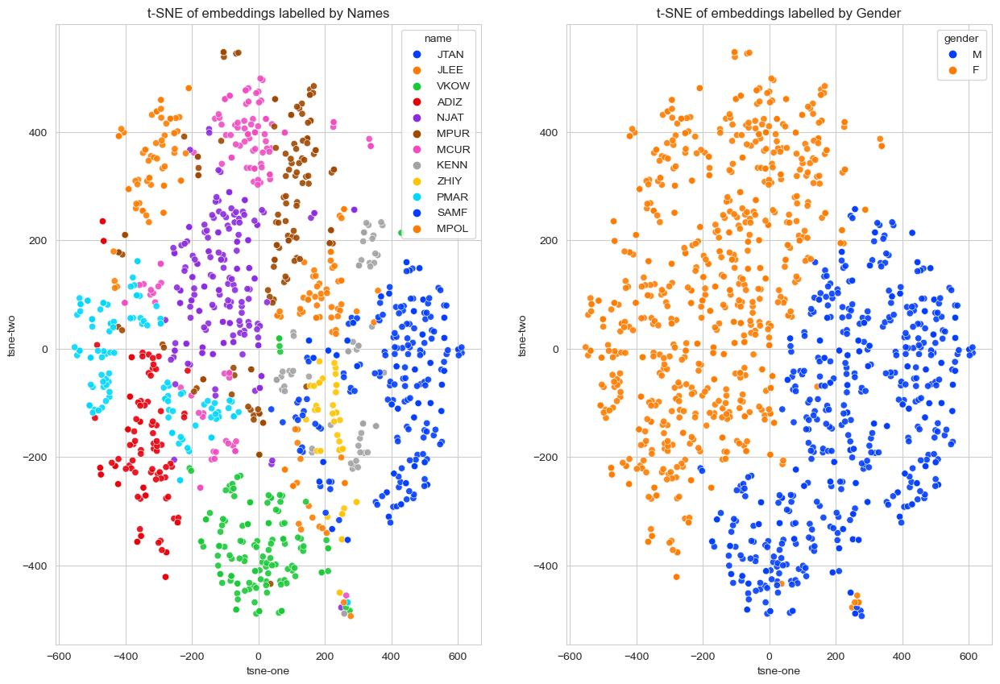

In [186]:
plt.figure(figsize=(15,10))
ax1 = plt.subplot(1, 2, 1)
sns.scatterplot(
    x="tsne-one", y="tsne-two",
    hue="name",
    palette=sns.color_palette("bright", len(df['name'].unique())),
    data=df,
    legend="full",
    alpha=0.9,
    ax=ax1
).set(title='t-SNE of embeddings labelled by Names')
ax2 = plt.subplot(1, 2, 2)
sns.scatterplot(
    x="tsne-one", y="tsne-two",
    hue="gender",
    palette=sns.color_palette("bright", len(df['gender'].unique())),
    data=df,
    legend="full",
    alpha=0.9,
    ax=ax2
).set(title='t-SNE of embeddings labelled by Gender')

# Comments
- Do note that each point is the embedding of a 1 sec crop of the person singing.
- We can clearly see the embedding is able to differentiate between male and female.
- The embedding within male or female voices are do appear to separate better than the RTVC embedder.
- It should give us a clue that the embeddings are able to provide good gender info.
- Embedding vector size of each person is also 256.
- This model has more hidden nodes in the LSTM layer than RTVC and trained with more voices, so it is expected to perform better.



# A comparision between 2 embedders

| Embedder | Data Trained | LSTM hidden nodes | LSTM layers | emb size | filesize |
|----------|--------------|-------------------|-------------|----------|----------|
| RTVC     | LibriSpeech  | 256               | 3           | 256      | 17.1 MB  |
| VF       | VoxCeleb2    | 768               | 3           | 256      | 48.5 MB  |

- Some slight differences, RTVC has a ReLU activation in between LSTM and linear layer, while in VF, the activation layer is absent.
- Both downsamples the audio to 16000kHz, and produces the mel spectrogram as inputs to the embedder.
- The preprocessing params are slightly different. We have to used back the parameters that are trained for.